In [1]:
import pandas as pd
import numpy as np
import sqlalchemy
import pgspecial

import itertools
import datetime
from dateutil.rrule import rrule, MONTHLY,YEARLY
from src import *
import seaborn as sns

from os.path import exists

#import importlib,sys
#importlib.reload(sys.modules['src'])
#from src import *


In [2]:
%load_ext sql

In [3]:
db_connect = "benj@localhost/olist"
connectStr =  f"postgresql://{db_connect}"
%sql $connectStr

'Connected: benj@olist'

# Exploration db

Nombre de clients dans la base

In [4]:
%%sql
select count(distinct customer_unique_id) from customers

 * postgresql://benj@localhost/olist
1 rows affected.


count
96096


In [5]:
nb_orders = %sql select count(*) from orders;
nb_t_id = %sql select count(*) from ( select distinct order_id,customer_id  from orders) t; 
print(f'{nb_orders} {nb_t_id}')

 * postgresql://benj@localhost/olist
1 rows affected.
 * postgresql://benj@localhost/olist
1 rows affected.
+-------+
| count |
+-------+
| 99441 |
+-------+ +-------+
| count |
+-------+
| 99441 |
+-------+


Status des commandes

In [6]:
%sql select distinct order_status,count(*) from orders group by order_status

 * postgresql://benj@localhost/olist
8 rows affected.


order_status,count
approved,2
canceled,625
created,5
delivered,96478
invoiced,314
processing,301
shipped,1107
unavailable,609


Toutes les commandes ont au moins un paiement associé ?

In [7]:
%%sql 
select distinct order_status,count(*) from orders o where
not exists (select 1 from order_payments pa where pa.order_id = o.order_id)
group by order_status

 * postgresql://benj@localhost/olist
1 rows affected.


order_status,count
delivered,1


Les différrents types de paiement

In [8]:
%%sql
select distinct payment_type,count(*) from order_payments
group by payment_type 

 * postgresql://benj@localhost/olist
5 rows affected.


payment_type,count
boleto,19784
credit_card,76795
debit_card,1529
not_defined,3
voucher,5775


Payment en plusieurs versements = payment_installments

Les paiments avec des bons et en liquide se font en une fois.

In [9]:
%%sql
select distinct payment_installments,payment_type,count(*) from order_payments
where payment_type in ('voucher','boleto')
group by payment_installments,payment_type

 * postgresql://benj@localhost/olist
2 rows affected.


payment_installments,payment_type,count
1,voucher,5775
1,boleto,19784


Les paiements d'une commande peuvent se faire avec plusieurs modes de paiement; chaque type de paiement se voit attribué un numéro de séquence

In [10]:
%%sql
select * from order_payments 
where order_id = (select distinct order_id from order_payments where payment_sequential = (select max(payment_sequential) from order_payments LIMIT 1) LIMIT 1)
order by payment_sequential

 * postgresql://benj@localhost/olist
29 rows affected.


order_id,payment_sequential,payment_type,payment_installments,payment_value,id
fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71,14322
fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51,23075
fa65dad1b0e818e3ccc5cb0e39231352,3,voucher,1,2.95,65642
fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16,9986
fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66,28331
fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02,29649
fa65dad1b0e818e3ccc5cb0e39231352,7,voucher,1,0.32,82594
fa65dad1b0e818e3ccc5cb0e39231352,8,voucher,1,26.02,68854
fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08,17275
fa65dad1b0e818e3ccc5cb0e39231352,10,voucher,1,12.86,19566


Nombre de paiements par voucher

In [11]:
%%sql
select count(*) from customers c
join orders o on c.customer_id = o.customer_id
join order_payments pa on pa.order_id = o.order_id
where pa.payment_type = 'voucher'

 * postgresql://benj@localhost/olist
1 rows affected.


count
5775


Nombre de commandes sans commentaires

In [12]:
%%sql
select count(distinct order_id) from orders o
where not exists(select 1 from order_reviews r where r.order_id = o.order_id)

 * postgresql://benj@localhost/olist
1 rows affected.


count
768


In [13]:
order_dates = %sql select date_trunc('day',min(order_delivered_customer_date)),date_trunc('day',max(order_delivered_customer_date)) + INTERVAL '1 day' from orders
print(f'order_dates: \n{order_dates}')
review_dates = %sql select min(review_creation_date),max(review_creation_date) from order_reviews
print(f'review_dates: \n{review_dates}')

 * postgresql://benj@localhost/olist
1 rows affected.
order_dates: 
+---------------------+---------------------+
|      date_trunc     |       ?column?      |
+---------------------+---------------------+
| 2016-10-11 00:00:00 | 2018-10-18 00:00:00 |
+---------------------+---------------------+
 * postgresql://benj@localhost/olist
1 rows affected.
review_dates: 
+---------------------+---------------------+
|         min         |         max         |
+---------------------+---------------------+
| 2016-10-02 00:00:00 | 2018-08-31 00:00:00 |
+---------------------+---------------------+


Nombre de dates de livraison en fonction du statut de la commande

In [14]:
%%sql 
select count( distinct order_delivered_customer_date),order_status,count(*) from orders group by order_status


 * postgresql://benj@localhost/olist
8 rows affected.


count,order_status,count_1
0,approved,2
6,canceled,625
0,created,5
95658,delivered,96478
0,invoiced,314
0,processing,301
0,shipped,1107
0,unavailable,609


Ordres annulés

In [15]:
%%sql
select distinct order_purchase_timestamp,order_approved_at,order_delivered_customer_date from orders where order_status = 'canceled'

 * postgresql://benj@localhost/olist
625 rows affected.


order_purchase_timestamp,order_approved_at,order_delivered_customer_date
2016-09-05 00:15:34,2016-10-07 13:17:15,None
2016-09-13 15:24:19,2016-10-07 13:16:46,None
2016-10-02 22:07:52,2016-10-06 15:50:56,None
2016-10-03 21:01:41,2016-10-04 10:18:57,2016-11-08 10:58:34
2016-10-04 10:05:45,2016-10-04 10:26:40,None
2016-10-04 11:44:01,2016-10-05 08:45:09,None
2016-10-04 14:51:15,2016-10-06 15:56:40,None
2016-10-04 19:41:32,None,None
2016-10-04 20:41:45,2016-10-06 15:57:38,None
2016-10-05 11:23:13,None,None


## Generate DB request


In [13]:
#payment types
def take(n,res):
    return list(map(lambda t: t[n],res))

def make_sub_reqs(agg_req,fields_reqs):
    """
      Generate one entry in args* for function build_req based on one entry in user config
    """
    def f (main_table,agg_table,histo_date):
        agg = f"{agg_table} as ({agg_req((histo_date,))})"
        return (
            agg,
            [ fields_req((agg_table,main_table,f"{agg_table}_{str(i)}")) for (i,fields_req) in enumerate(fields_reqs)]
        )

    return f

def build_req(*args,start,end,limit=None):
    """
        main entry for request generation:
        - start and end are dates that define the time slot
        - args is a list of (cte,fields) to be considered.
          args is built from user config using function make_sub_reqs
        return an sql request (string)
    """
    def make_args(*args,main_table):
        return list(zip(
                    args,
                    map(
                        lambda r: {'main_table':f'{main_table}','agg_table':f'agg_{str(r)}','histo_date':end},
                        range(len(args))
                    )
                )
        )

    def join_sub_req(reqs):
        return list(map(lambda t: (f"({t[0]}) as {t[1]}",t[2]),reqs))
    
    def call_f(farg):
        f    = farg[0]
        args = farg[1]
        return f(**args) 

    # main request
    main_table = 'M'
    
    #generate sub queries
    fargs = make_args(*args, main_table = main_table)
    sub_reqs = list(map(lambda farg: call_f(farg),fargs))

    # Common table expressions
    ctes  =  "WITH\n" + ',\n'.join(take(0,sub_reqs)) + "\n"
    #(fields,joins) 
    tmp = join_sub_req(itertools.chain(*take(1,sub_reqs)))
    fields = "\n" + ',\n'.join(take(0,tmp)) + "\n"
    joins  = "\n" + '\n'.join(take(1,tmp)) + "\n"
    #limits
    limits_e =  f'LIMIT {limit}' if limit is not None else ''

    return f"""
    {ctes} select distinct {main_table}.c_customer_unique_id,{fields} from olist_view {main_table} {joins} where {main_table}.o_order_purchase_timestamp  > '{start}' and {main_table}.o_order_purchase_timestamp <= '{end}' 
    {limits_e}
    """


## User config

In [15]:
def selected_payment_types():
    types = %sql select distinct payment_type from order_payments
    return list(filter(lambda p : p != 'not_defined',take(0,types)))

def make_payment_type(payment_type):
    return lambda t: (
        f"select {t[2]}.count"
        ,
        f'nb_{payment_type}'
        ,
        f"left outer join {t[0]} as {t[2]} on {t[2]}.pa_payment_type = '{payment_type}' and {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
    )

configs = [ 
    (
    lambda t:
    f"""
        select c_customer_unique_id,pa_payment_type,count(*) 
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' 
        group by c_customer_unique_id,pa_payment_type
    """,
        [ make_payment_type(payment_type) for payment_type in selected_payment_types() ]
    ),
    (
    lambda t:    
    f"""
        with v as (
            select c_customer_unique_id,pa_payment_type,sum(pa_payment_value)
            from olist_view
            where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' 
            group by c_customer_unique_id,pa_payment_type
        ),
        t as (select v.c_customer_unique_id,max(v.sum) from v group by v.c_customer_unique_id)
        select v.c_customer_unique_id,v.pa_payment_type,ROW_NUMBER () OVER (PARTITION BY v.c_customer_unique_id) from v 
        join t on t.max = v.sum and t.c_customer_unique_id = v.c_customer_unique_id
    """,
        [
            lambda t: (
                f"{t[2]}.pa_payment_type"
                ,
                "payment_type_max"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id and {t[2]}.row_number = 1"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,max(pa_payment_installments) as m1,max(pa_payment_sequential) as m2
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.m1"
                ,
                "payment_installments_max"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"select {t[2]}.m2"
                ,
                "payment_sequential_max"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct t.c_customer_unique_id,max(t.order_value),round(avg(t.order_value)::numeric,2) as avg,stddev_pop(t.order_value),min(t.order_value) from (
        select c_customer_unique_id,sum(i_price+COALESCE(i_freight_value,0.0)) as order_value
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
        group by c_customer_unique_id,i_order_id
        ) t
        group by t.c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.max"
                ,
                "order_value_max"
                ,
                  f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"select {t[2]}.min"
                ,
                "order_value_min"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"select {t[2]}.avg"
                ,
                "order_value_avg"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"select {t[2]}.stddev_pop"
                ,
                "order_value_stddev"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select c_customer_unique_id,count(*)
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.count"
                ,
                "nb_orders"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select t.c_customer_unique_id,round(avg(t.count)::numeric,2) as avg from (
        select c_customer_unique_id,count(*)
            from olist_view
            where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
            group by c_customer_unique_id,i_order_id
        ) t
        group by t.c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.avg"
                ,
                "nb_items_order_avg"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,max(COALESCE(i_freight_value,0.0)/i_price)
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' 
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.max"
                ,
                "r_freight_price_max"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
    (
    lambda t:
    f"""
        with t as (
            select c_customer_unique_id,p_product_category_name,p_high_category_name,sum(i_price)
            from olist_view
            where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' and p_product_category_name is not null
            group by c_customer_unique_id,p_product_category_name,p_high_category_name
        ),
        v as (select distinct t.c_customer_unique_id,max(t.sum) from t group by t.c_customer_unique_id)
        select distinct t.c_customer_unique_id,t.p_product_category_name,t.p_high_category_name,ROW_NUMBER () OVER (PARTITION BY t.c_customer_unique_id) from t 
        join v on v.c_customer_unique_id = t.c_customer_unique_id and t.sum = v.max 
    """,
        [
            lambda t: (
                f"select {t[2]}.p_product_category_name"
                ,
                "product_cat_total_max"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id and {t[2]}.row_number = 1"
            ),
            lambda t: (
                f"select {t[2]}.p_high_category_name"
                ,
                "high_cat_total_max"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id and {t[2]}.row_number = 1"
            )
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct  c_customer_unique_id,max(r_review_score), avg(r_review_score)::numeric(10,2) as avg,min(r_review_score)
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' and r_review_creation_date <= '{t[0]}' 
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"""select {t[2]}.min"""
                ,
                "review_score_min"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"""select {t[2]}.avg"""
                ,
                "review_score_avg"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            ),
            lambda t: (
                f"""select {t[2]}.max"""
                ,
                "review_score_max"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )            
        ]
    ),
    (
    lambda t:    
    f"""
        select c_customer_unique_id,count(*)
        from olist_view
        where o_order_purchase_timestamp <= '{t[0]}' and o_order_status = 'canceled' 
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"""select {t[2]}.count"""
                ,
                "nb_orders_canceled"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )      
        ]
    ), 
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,'{t[0]}'::date - min(o_order_purchase_timestamp)::date as R
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"""select {t[2]}.R"""
                ,
                "nb_days_since_last_order"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )      
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct v.c_customer_unique_id,sum(v.pa_payment_value)
        from olist_view v
        join (
            select c_customer_unique_id,max(o_order_delivered_customer_date)
            from olist_view
            where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
            group by c_customer_unique_id
        ) t on t.c_customer_unique_id = v.c_customer_unique_id
        where v.o_order_delivered_customer_date = t.max and v.o_order_status = 'delivered'    
        group by v.c_customer_unique_id
    """,
        [
            lambda t: (
                f"""select {t[2]}.sum"""
                ,
                "amount_last_order"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )      
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,max(p_product_weight_g) as weight,max(p_product_length_cm*p_product_height_cm*p_product_width_cm) as volume
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered'       
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"""select {t[2]}.weight"""
                ,
                "weight_max"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"                
            ),
            lambda t: (
                f"""select {t[2]}.volume"""
                ,
                "volume_max"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )     
        ]
    ), 
    (lambda t:(
        f"""
        with t as (select distinct c_customer_unique_id,c_customer_city,c_customer_state,o_order_purchase_timestamp  from olist_view order by o_order_purchase_timestamp DESC)
        select t.*,ROW_NUMBER () OVER (PARTITION BY t.c_customer_unique_id) from  t
        """
        ),
        [
            lambda t: (
                f"""select {t[2]}.c_customer_city"""
                ,
                "city"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id and {t[2]}.row_number = 1"                
            ),
            lambda t: (
                f"""select {t[2]}.c_customer_state"""
                ,
                "state"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id and {t[2]}.row_number = 1"
            )
        ]
    ), 
    (lambda t:(
        f"""
        select distinct c_customer_unique_id,avg(distance) as d, avg(lat) as lt, avg(lng) as lg
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' -- and r_review_creation_date <= '{t[0]}' 
        group by c_customer_unique_id
        """
        ),
        [
            lambda t: (
                f"""select {t[2]}.d"""
                ,
                "distance"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"                
            ),
            lambda t: (
                f"""select {t[2]}.lt"""
                ,
                "lat"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"                
            ),
            lambda t: (
                f"""select {t[2]}.lg"""
                ,
                "lng"
                ,
                f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"                
            )                        
        ]
    ),
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,sum(i_price)
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' 
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.sum"
                ,
                "total_order"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),    
    (
    lambda t:    
    f"""
        select distinct c_customer_unique_id,max(estimation_error)
        from olist_view
        where o_order_delivered_customer_date <= '{t[0]}' and o_order_status = 'delivered' 
        group by c_customer_unique_id
    """,
        [
            lambda t: (
                f"select {t[2]}.max"
                ,
                "max_delay_delivery"
                ,
                 f"left outer join {t[0]} as {t[2]} on {t[1]}.c_customer_unique_id = {t[2]}.c_customer_unique_id"
            )
        ]
    ),
]


 * postgresql://benj@localhost/olist
5 rows affected.


## Helping function for generating dataframe based on sql query

In [11]:

def min_max_dates():
    """
        return min max date interval
    """
    raw_date = %sql select date_trunc('day',min(order_purchase_timestamp)) - INTERVAL '1 day' ,date_trunc('day',max(order_delivered_customer_date)) + INTERVAL '1 day' from orders
    for row in  raw_date:
        (min_date,max_date) = row
    return (min_date,max_date)

def dates_histo(freq,depth=12):
    """
       generate list of dates
    """
    (min_date,max_date) = min_max_dates()
    starts = [dt for dt in rrule(MONTHLY, dtstart=min_date, interval=freq,until=max_date)]
    return list(
            filter(
            lambda l : len(l) == 2
            ,
            [
                list(rrule(MONTHLY, dtstart=start,count=2, interval=depth,until=max_date))
                for start in starts
            ]
        )
    )

def generate_df(start,end,limit=None):
    """"
       generate a dataframe based on a sql request and user config
    """
    main_req = build_req(*list(map(lambda config:make_sub_reqs(*config), configs)),start=start,end=end,limit=limit)
    #print(main_req)
    r = %sql $main_req
    if r is not None:
        tmp = r.DataFrame()
        if len(tmp) > 0:
            tmp.fillna(0,inplace=True)
            tmp.set_index('c_customer_unique_id',drop=True,inplace=True,verify_integrity=True)
            # force average as float ??
            for col in ['nb_items_order_avg','review_score_avg','nb_items_order_avg','order_value_avg']:
                tmp[col] = tmp[col].astype('float64')          
            tmp = tmp[tmp['nb_orders'] != 0]
            tmp = tmp[tmp['amount_last_order'] != 0]
            return tmp

def generate_full_df(limit=None):
    (start,end) = min_max_dates()
    return generate_df(start,end,limit=limit)
 
def  generate_all_df(depths,freqs,limit=None):
    date_to_str = lambda d : str(d)[:10]
    for depth in depths:
        for freq in freqs:
            for (i,(start,end)) in enumerate(dates_histo(freq,depth)):
                df = generate_df(start,end,limit)
                if df is not None:
                    path = f'./data/dfs/maintenance/{depth}/{freq}/olist_{i}'
                    df.to_csv(f'{path}.csv')
                    pd.DataFrame(
                        [[date_to_str(start),date_to_str(end),freq,depth]],
                        columns=['start','end','freq','depth']
                    ).to_json(f'{path}.json')


## Generate dataframes

In [20]:
FLAG = './data/dfs/maintenance/flag.txt'
if not(exists(FLAG)):
    print('generate dfs ...')
    generate_all_df(depths=[6,9,12],freqs=[1,2,3,4,5,6])
    with open(FLAG, 'w') as f:
        f.write(str(datetime.datetime.now()))

generate dfs ...
 * postgresql://benj@localhost/olist
1 rows affected.
 * postgresql://benj@localhost/olist
3009 rows affected.
 * postgresql://benj@localhost/olist
5601 rows affected.
 * postgresql://benj@localhost/olist
7744 rows affected.
 * postgresql://benj@localhost/olist
11343 rows affected.
 * postgresql://benj@localhost/olist
14425 rows affected.
 * postgresql://benj@localhost/olist
17562 rows affected.
 * postgresql://benj@localhost/olist
19926 rows affected.
 * postgresql://benj@localhost/olist
21511 rows affected.
 * postgresql://benj@localhost/olist
23519 rows affected.
 * postgresql://benj@localhost/olist
27541 rows affected.
 * postgresql://benj@localhost/olist
29793 rows affected.
 * postgresql://benj@localhost/olist
33011 rows affected.
 * postgresql://benj@localhost/olist
35515 rows affected.
 * postgresql://benj@localhost/olist
38348 rows affected.
 * postgresql://benj@localhost/olist
40723 rows affected.
 * postgresql://benj@localhost/olist
39642 rows affected.
 * p

Dataset complet

In [16]:
full_df = generate_full_df()

 * postgresql://benj@localhost/olist
1 rows affected.
 * postgresql://benj@localhost/olist
96096 rows affected.


Sauvegarde du jeu de données complet

In [8]:
full_df.to_csv(f'./data/dfs/results/full.csv')

## Détails des features client

- c_customer_unique_id: identifiant client.
- nb_boleto           : nombre de paiements effectués en liquide.
- nb_debit_card       : nombre de paiements effectués avec une carte à débit.
- nb_voucher          : nombre de paiements effectués avec des bons.
- nb_credit_card      : nombre de paiements effectués avec une carte de crédit.
- payment_type_max    : type de paiement utilisé pour le plus gros montant.
- payment_installments_max : nombre maximum de versements effectués pour un seul paiement.
- payment_sequential_max   : nombre maximum de types de paiement utilisés pour un seul paiement.
- order_value_max          : montant de la commande la plus chère
- order_value_min          : montant de la commande la moins chère
- order_value_avg          : montant moyen de commande 
- order_value_stddev       : écart-type du montant de commande
- nb_orders                : nombre de commandes
- nb_items_order_avg       : nombre moen d'articles par commande
- r_freight_price_max      : ratio prix article/frais de livraison maximum
- product_cat_total_max    : catégorie de produit
- high_cat_total_max       : catégorie de produit (regroupement)
- review_score_min         : note la plus basse
- review_score_avg         : note moyenne
- review_score_max         : note la plus haute
- nb_orders_canceled       : nombre de commandes annulés
- nb_days_since_last_order : nombre de jours depuis la dernière commande
- amount_last_order        : montant de la dernière commande
- weight_max               : poids maximum
- volume_max               : volume maximum
- city                     : ville 
- state                    : état
- distance                 : distance depuis le siège social d'olist
- total_order


Nombre de clients actifs

In [17]:
len(full_df)

93349

Affichage des potentiels doublons

In [29]:
#def dup(df,subset=None):
#    duplicated = full_df.duplicated(subset)
#    return duplicated[duplicated == True]
#
#dup_ = dup(full_df,subset=['c_customer_unique_id'])
#tmp = full_df['c_customer_unique_id'].isin(full_df.loc[dup_.index,:]['c_customer_unique_id'])
#tmp = tmp[tmp == True]
#display_all(full_df.loc[tmp.index,:])

In [ ]:
%%sql
select * from olist_view where c_customer_unique_id in ('830d5b7aaa3b6f1e9ad63703bec97d23','c400e8b4b9b09c840845352f51bd9add')

 * postgresql://benj@localhost/olist
4 rows affected.


c_customer_id,c_customer_unique_id,c_customer_zip_code_prefix,c_customer_city,c_customer_state,o_order_id,o_customer_id,o_order_status,o_order_purchase_timestamp,o_order_approved_at,o_order_delivered_carrier_date,o_order_delivered_customer_date,o_order_estimated_delivery_date,i_order_id,i_order_item_id,i_product_id,i_seller_id,i_shipping_limit_date,i_price,i_freight_value,p_product_id,p_product_category_name,p_high_category_name,p_product_name_lenght,p_product_description_lenght,p_product_photos_qty,p_product_weight_g,p_product_length_cm,p_product_height_cm,p_product_width_cm,pa_order_id,pa_payment_sequential,pa_payment_type,pa_payment_installments,pa_payment_value,r_review_id,r_order_id,r_review_score,r_review_comment_title,r_review_comment_message,r_review_creation_date,r_review_answer_timestamp,distance,lat,lng
86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,bfbd0f9bdef84302105ad712db648a6c,3,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,5a6b04657a4c5ee34285d1e4619a96b4,health_beauty,health/beauty,34,1036,1,1000.0,16.0,16.0,16.0,None,None,None,None,None,6916ca4502d6d3bfd39818759d55d536,bfbd0f9bdef84302105ad712db648a6c,1,None,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,561.5286736003741,-20.5861963784001861,-47.8637566934035077
86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,bfbd0f9bdef84302105ad712db648a6c,2,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,5a6b04657a4c5ee34285d1e4619a96b4,health_beauty,health/beauty,34,1036,1,1000.0,16.0,16.0,16.0,None,None,None,None,None,6916ca4502d6d3bfd39818759d55d536,bfbd0f9bdef84302105ad712db648a6c,1,None,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,561.5286736003741,-20.5861963784001861,-47.8637566934035077
86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,bfbd0f9bdef84302105ad712db648a6c,1,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,5a6b04657a4c5ee34285d1e4619a96b4,health_beauty,health/beauty,34,1036,1,1000.0,16.0,16.0,16.0,None,None,None,None,None,6916ca4502d6d3bfd39818759d55d536,bfbd0f9bdef84302105ad712db648a6c,1,None,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,561.5286736003741,-20.5861963784001861,-47.8637566934035077
ebf4a394f95a53cf104a110b3ec5ac28,c400e8b4b9b09c840845352f51bd9add,96030,pelotas,RS,26b47634ae036af085a067dddf95bd77,ebf4a394f95a53cf104a110b3ec5ac28,delivered,2018-04-23 15:41:37,2018-04-24 17:17:00,2018-04-26 12:25:00,2018-05-12 17:24:43,2018-05-28 00:00:00,26b47634ae036af085a067dddf95bd77,1,53b36df67ebb7c41585e8d54d6772e08,4869f7a5dfa277a7dca6462dcf3b52b2,2018-04-27 16:33:03,106.9,None,53b36df67ebb7c41585e8d54d6772e08,watches_gifts,fashion/clothes,33,523,3,584.0,16.0,11.0,13.0,26b47634ae036af085a067dddf95bd77,1,credit_card,3,106.9,f0d45a919c19e2baf255dcbf6626dc65,26b47634ae036af085a067dddf95bd77,1,None,None,2018-05-13 00:00:00,2018-05-16 00:35:49,782.841303793932,-31.7607938481236170,-52.3718810136588226


Visualisation du dataset

In [30]:
display_all_col(full_df)

,nb_boleto,nb_debit_card,nb_voucher,nb_credit_card,payment_type_max,payment_installments_max,payment_sequential_max,order_value_max,order_value_min,order_value_avg,order_value_stddev,nb_orders,nb_items_order_avg,r_freight_price_max,product_cat_total_max,high_cat_total_max,review_score_min,review_score_avg,review_score_max,nb_orders_canceled,nb_days_since_last_order,amount_last_order,weight_max,volume_max,city,state,distance,lat,lng,total_order
c_customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,0.0,1.0,credit_card,8.0,1.0,141.900000,141.900000,141.90,0.0,1.0,1.0,0.092379,bed_bath_table,home,5.0,5.0,5.0,0.0,161.0,141.90,1500.0,7616.0,cajamar,SP,358.972072,-23.3403841499411520,-46.8311064116665603,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,0.0,1.0,credit_card,1.0,1.0,27.189999,27.189999,27.19,0.0,1.0,1.0,0.438624,health_beauty,health/beauty,4.0,4.0,4.0,0.0,164.0,27.19,375.0,5148.0,osasco,SP,347.516036,-23.5590441919965300,-46.7885162167312231,18.90
0000f46a3911fa3c0805444483337064,0.0,0.0,0.0,1.0,credit_card,8.0,1.0,86.220000,86.220000,86.22,0.0,1.0,1.0,0.249565,stationery,misc,3.0,3.0,3.0,0.0,587.0,86.22,1500.0,43750.0,sao jose,SC,246.077376,-27.5432351312324969,-48.6348709566151039,69.00
0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,0.0,1.0,credit_card,4.0,1.0,43.620000,43.620000,43.62,0.0,1.0,1.0,0.678338,telephony,tech,4.0,4.0,4.0,0.0,371.0,43.62,150.0,1045.0,belem,PA,2683.106962,-1.31378123292543940000,-48.4834087811235696,25.99
0004aac84e0df4da2b147fca70cf8255,0.0,0.0,0.0,1.0,credit_card,6.0,1.0,196.890000,196.890000,196.89,0.0,1.0,1.0,0.093833,telephony,tech,5.0,5.0,5.0,0.0,338.0,196.89,6050.0,528.0,sorocaba,SP,294.684103,-23.5055880131225555,-47.4698203673933458,180.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0.0,0.0,0.0,2.0,credit_card,10.0,1.0,2067.420000,2067.420000,2067.42,0.0,2.0,2.0,0.351676,health_beauty,health/beauty,5.0,5.0,5.0,0.0,497.0,4134.84,30000.0,251625.0,sanharo,PE,2367.506666,-8.3629253013860840,-36.5622914364212260,1570.00
fffea47cd6d3cc0a88bd621562a9d061,0.0,0.0,0.0,1.0,credit_card,1.0,1.0,84.580000,84.580000,84.58,0.0,1.0,1.0,0.303437,baby,children,4.0,4.0,4.0,0.0,312.0,84.58,1720.0,32076.0,feira de santana,BA,1865.039147,-12.2179003309775502,-38.9592374534775437,64.89
ffff371b4d645b6ecea244b27531430a,0.0,0.0,0.0,1.0,credit_card,1.0,1.0,112.460000,112.460000,112.46,0.0,1.0,1.0,0.250945,auto,auto,5.0,5.0,5.0,0.0,618.0,112.46,600.0,3315.0,sinop,MT,1662.256243,-11.8347046566706724,-55.5081454221622001,89.90


(93349, 30)


Analyses univariées

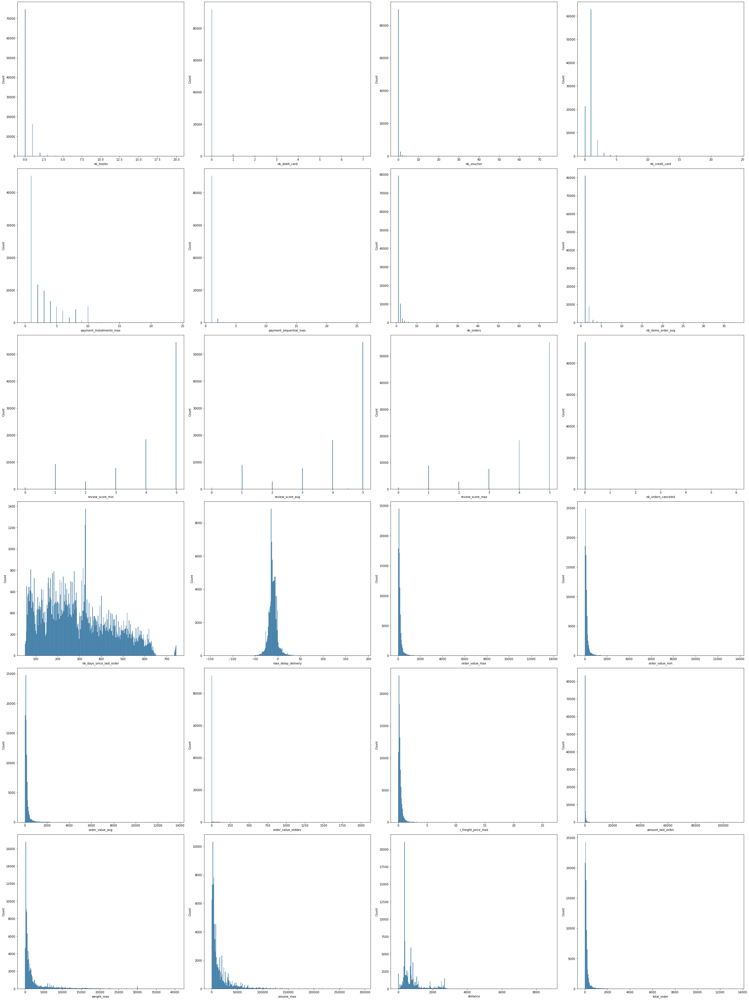

In [18]:
discrete_vars = ['nb_boleto','nb_debit_card','nb_voucher','nb_credit_card','payment_installments_max','payment_sequential_max','nb_orders','nb_items_order_avg','review_score_min','review_score_avg','review_score_max','nb_orders_canceled','nb_days_since_last_order','max_delay_delivery']
continue_vars = ['order_value_max','order_value_min','order_value_avg','order_value_stddev','r_freight_price_max','amount_last_order','weight_max','volume_max','distance','total_order']

def hist_plot(df,vars):
    n = 4
    s = len(vars)
    N = math.ceil(s/n)
    fig = plt.figure(figsize=(36,8*N),tight_layout=True)
    axes = fig.subplots(N,n)
    j = 0
    for i in range(0,N):
        k = (i+1)*n if (i+1)*n <= s else s 
        params = zip(vars[j:k],axes[i])
        list(map(lambda p: sns.histplot(data=df, x=p[0],ax=p[1],bins='sqrt'),params))
        j = k

hist_plot(full_df,discrete_vars+continue_vars)

Analyse univarée avec boxplot

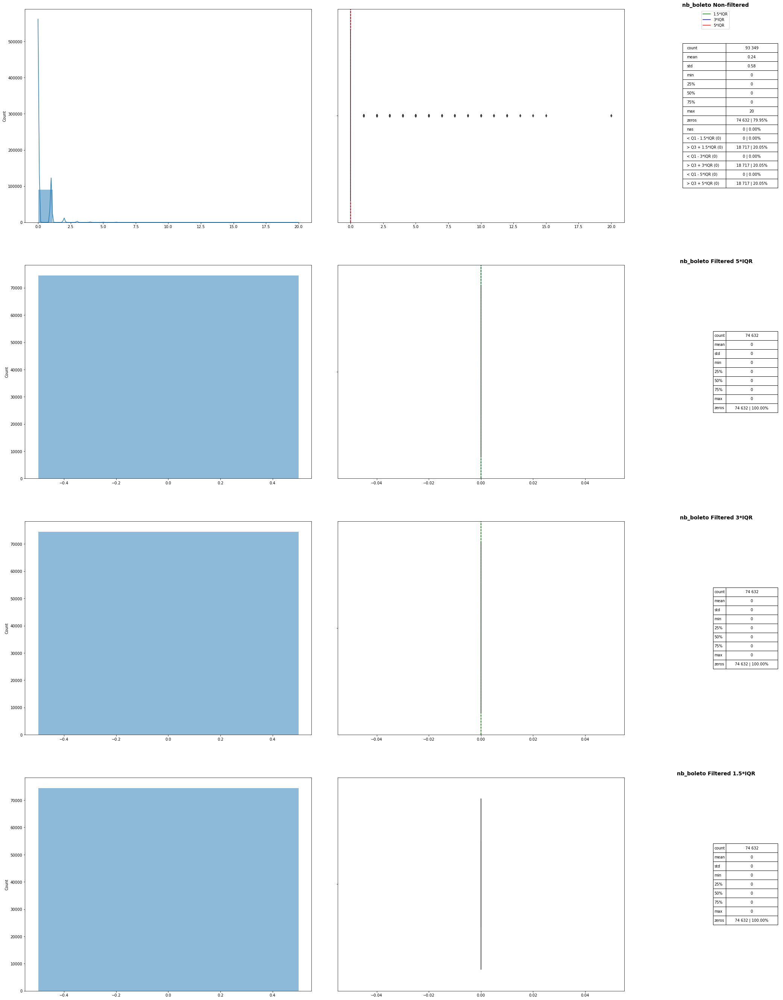

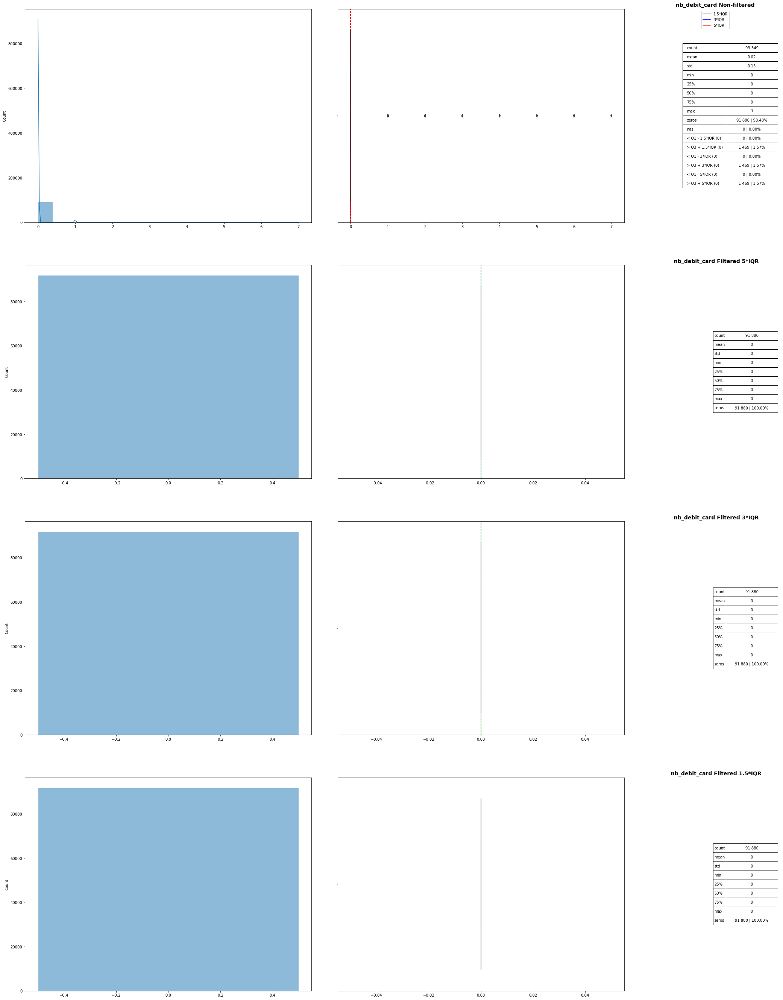

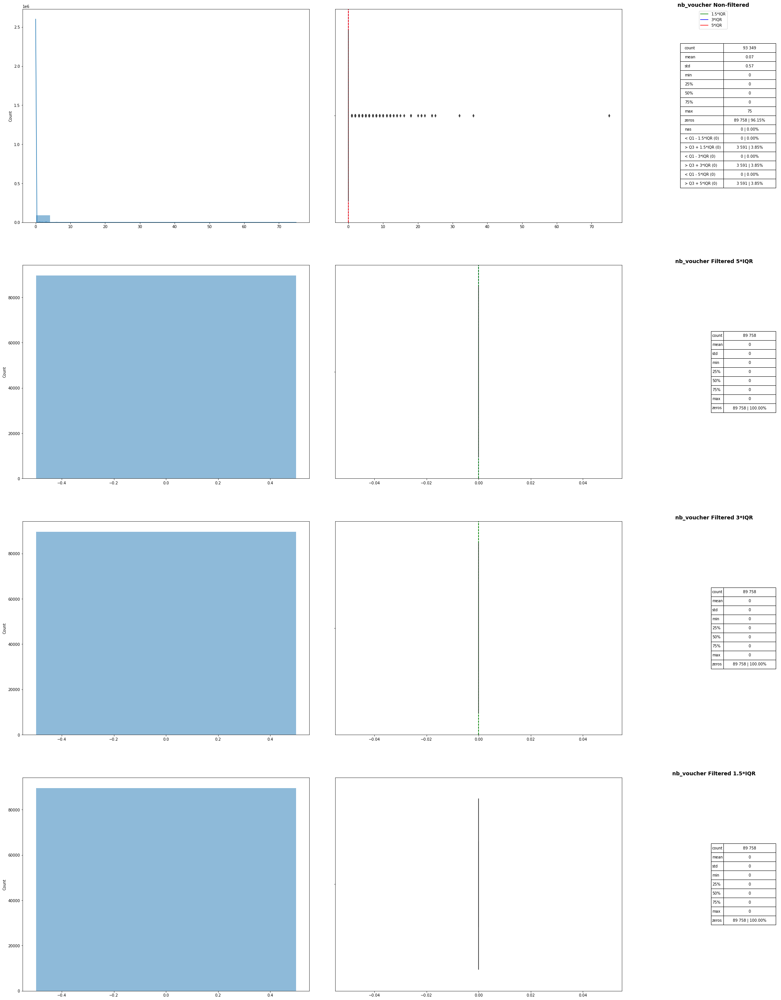

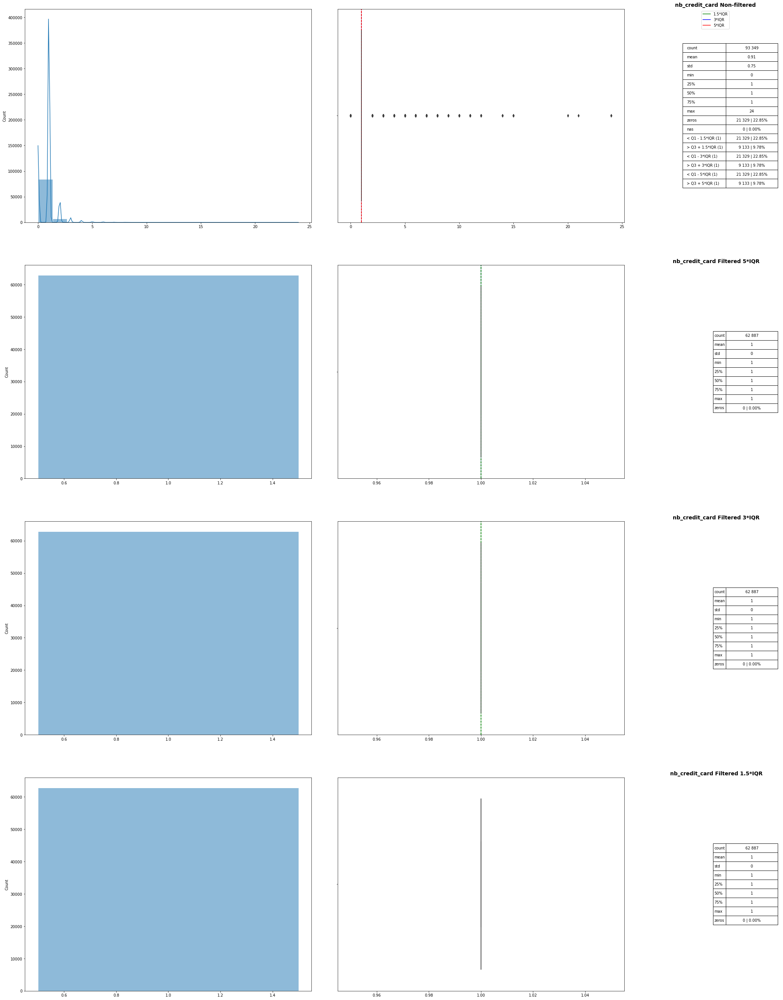

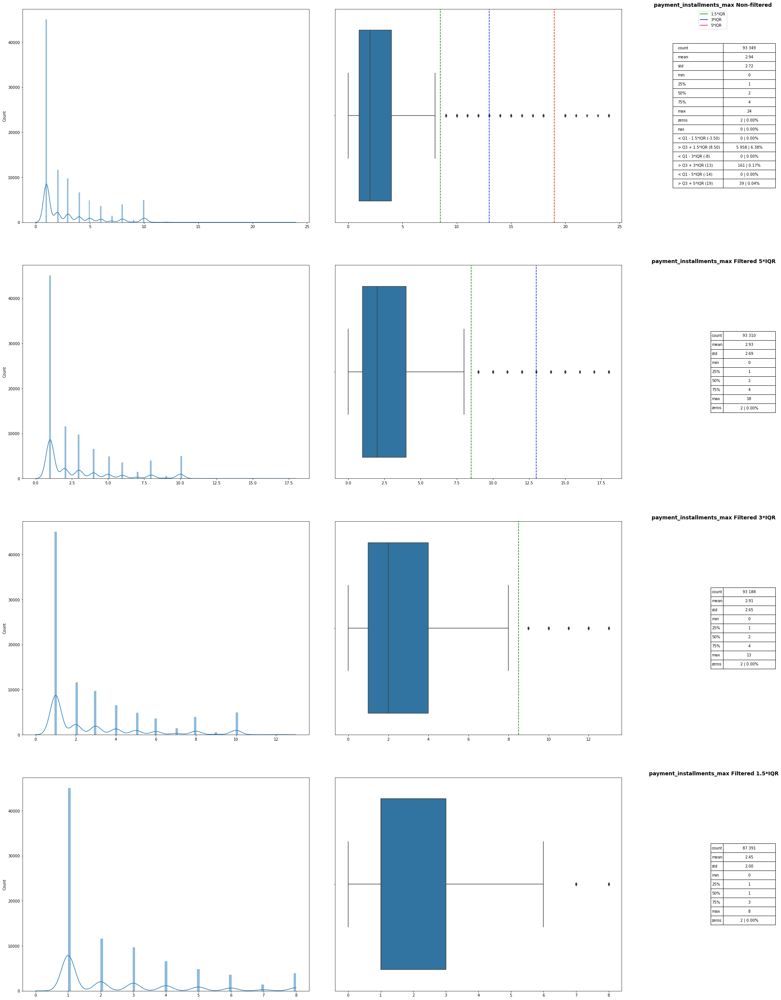

...

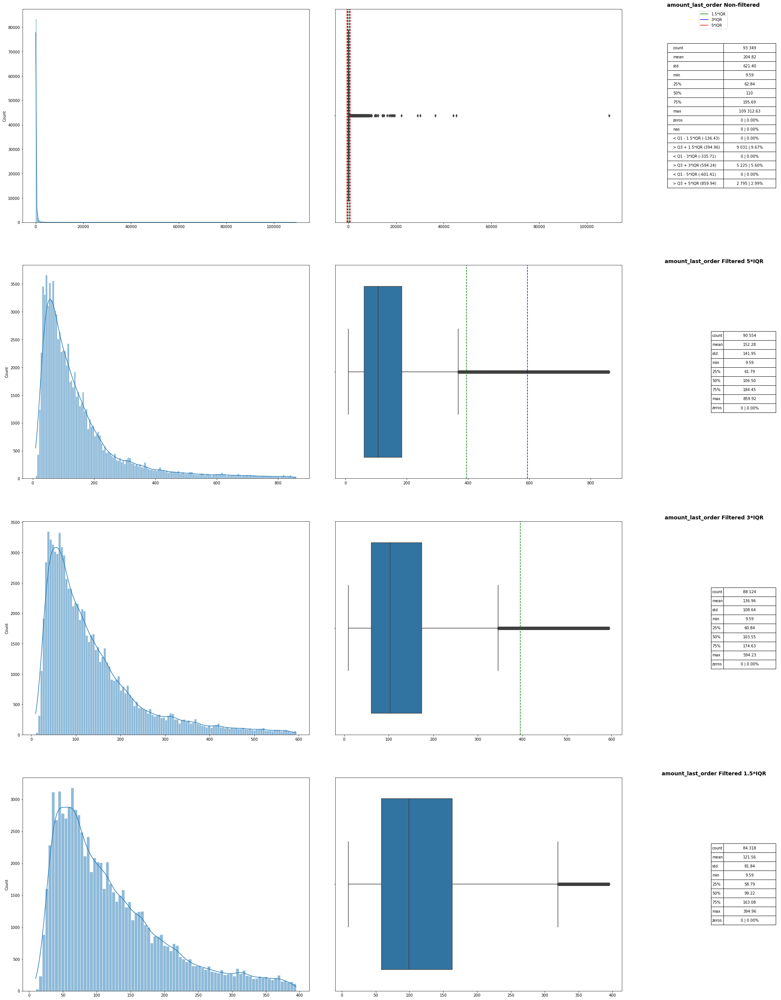

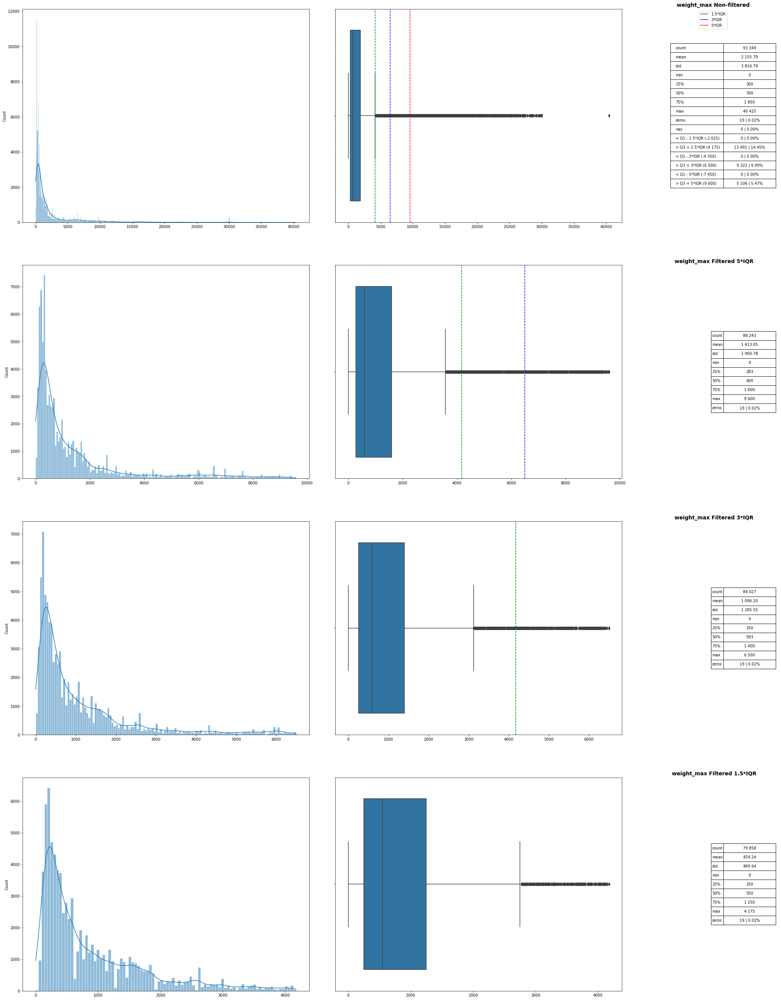

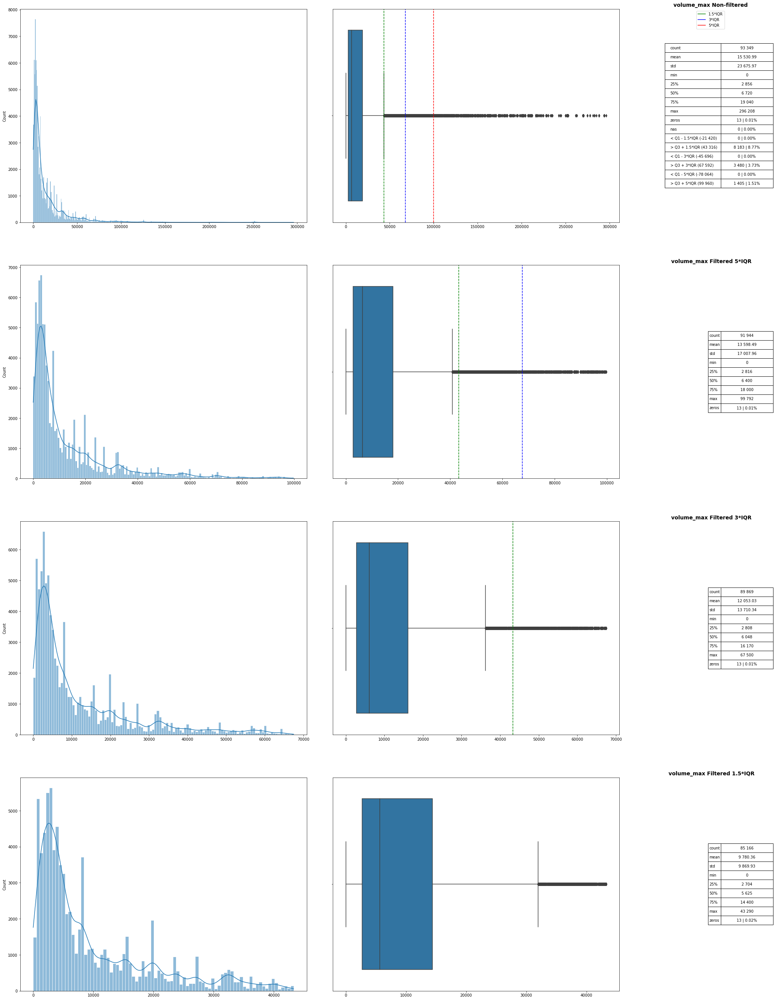

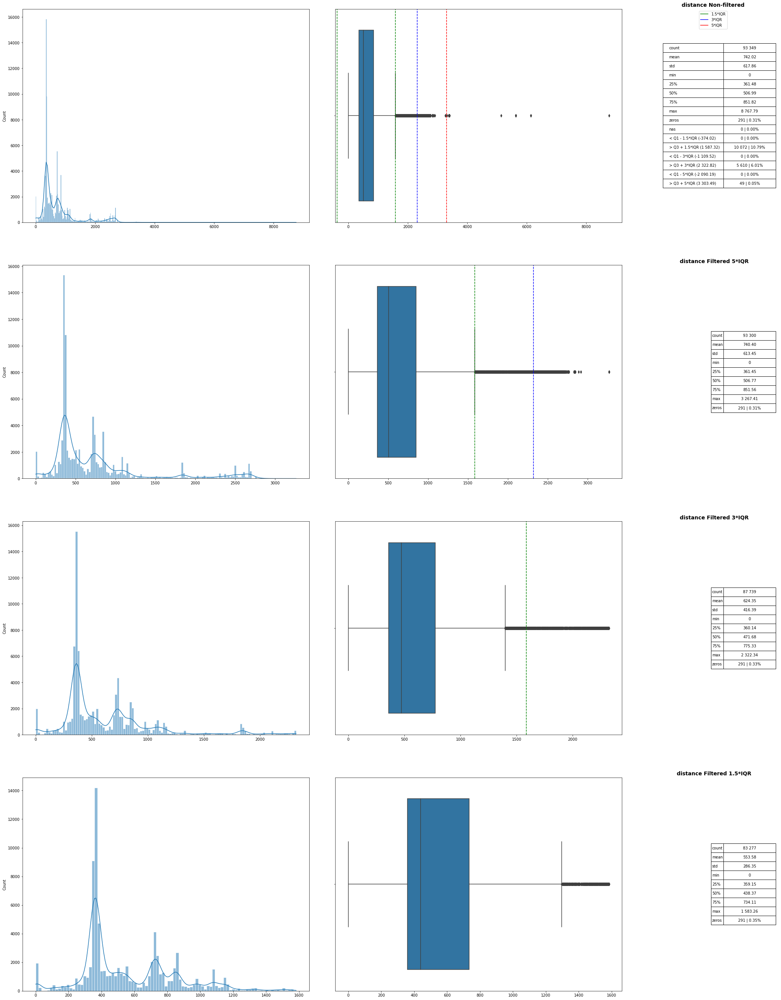

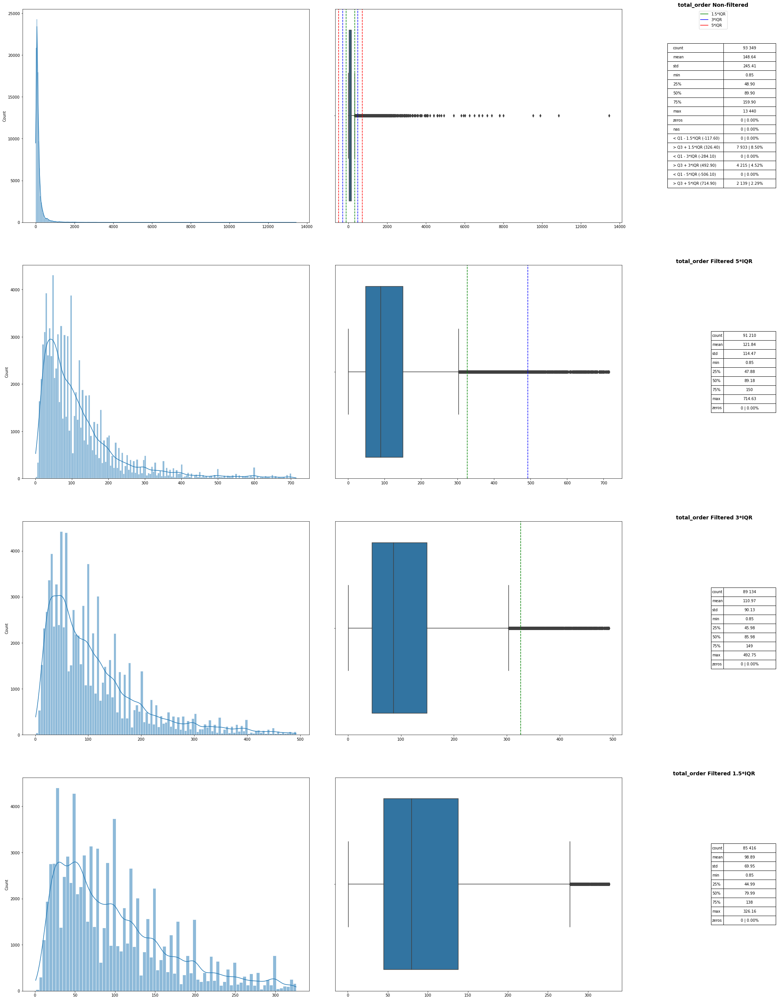

In [32]:
for col in full_df.select_dtypes('number').columns:
    univariate_num(full_df[col],['1.5*IQR','3*IQR','5*IQR'])
    plt.show()

## Analyse en composantes principales

### helping function for pca

In [19]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors
import matplotlib.patches as mpatches

def do_pca(df):
    df_filtered = df.select_dtypes('number')
    p = Pipeline([("1",StandardScaler()),("2",PCA())])
    p.fit_transform(df_filtered)
    return (p[-1],df_filtered.columns)

def display_one_component(pca,features,component,rot=45):
    sns.set_style("ticks",{'axes.grid' : True})
    df = pd.DataFrame(data=list(zip(pca.components_[component],features)),columns=['weight','feature'])
    g = sns.catplot(data=df,x='feature',y='weight',aspect=3,palette="deep")
    if rot is not None:
        g.set_xticklabels(features, rotation=rot, ha='right').add_legend(title=f"C{component+1}")
    plt.show() 

def num_components(variance_ratios,p):
    total = 0
    def below(x):
        nonlocal total 
        total = total+x
        return (total < p)
    return range(len(list(itertools.takewhile(below,variance_ratios) )))

def display_components(pca,features,p=0.9,rot=45):
    for c in num_components(pca.explained_variance_ratio_,p):
        display_one_component(pca,features,c,rot=rot)

def display_scree_plot(pca,figsize_=(36,12)):
    scree = pca.explained_variance_ratio_*100
    _,ax = plt.subplots(figsize=figsize_)
    ax.bar(np.arange(len(scree))+1, scree)
    ax.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o',alpha=1)
    ax.set_xticks(range(1,len(scree)+1,1))
    ax.set_yticks(range(0,105,5))
    ax.grid(True)
    plt.xlabel("Rang de l'axe d'inertie")
    plt.ylabel("Pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)
    
def get_N_distinct_colors(N,excludes=['light','ish']):
    def iter_colors(N):
        f = lambda x: [e not in x for e in excludes]
        i = 0
        for (n,c) in mcolors.get_named_colors_mapping().items():
            if(i == N):
                return
            if( all(f(n)) ):
                i = i +1
                yield c
    return [c for c in iter_colors(N)]

def display_circles(pca,labels=None, label_rotation=0, lims=None,figsize_=(20, 20)):
    pcs = pca.components_
    N = pcs.shape[1]
    #colors = [mcolors.to_rgba(c) for c in list(mcolors.get_named_colors_mapping().values())[:N]]
    colors = [mcolors.to_rgba(c) for c in get_N_distinct_colors(N)]
    n = N -2
    for d1, d2 in list(zip(list(range(n)),list(range(1,n+1)))): 
        # initialisation de la figure
        fig, ax = plt.subplots(figsize=figsize_)
        
        # définition des limites du graphique (suite)
        xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])
        
        #l = max(map( abs,[xmin, xmax, ymin, ymax]))
        #xmax, ymax = [1.1*l]*2
        #xmin, ymin = [-1.1*l]*2 
        xmax, ymax = [1]*2
        xmin, ymin = [-1]*2 
        
        # representation des features
        lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
        ax.add_collection(LineCollection(lines, axes=ax, alpha=1, colors=colors))

        # affichage des noms des variables  
        if labels is not None:
            # creation de la legende
            labels_ = map(lambda t: f'({t[1]}) {t[0]}',zip(labels,list(range(1,len(labels)+1))))
            patches = list(map(lambda p: mpatches.Patch(label=p[0],color=p[1]),zip(labels_,colors)))
            ax.legend(handles=patches,loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1)  
            for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                    plt.text(x, y, str(i+1), fontsize='10', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)

        # affichage du cercle
        #circle = plt.Circle((0,0), 1.08*l, facecolor='none', edgecolor='grey', ls='--')
        circle = plt.Circle((0,0), 1.0, facecolor='none', edgecolor='grey', ls='--')
        plt.gca().add_artist(circle)

        # définition des limites du graphique
        plt.xlim(xmin, xmax)
        plt.ylim(ymin, ymax)

        # affichage des lignes horizontales et verticales
        plt.plot([-1, 1], [0, 0], color='grey', ls='--')
        plt.plot([0, 0], [-1, 1], color='grey', ls='--')

        # nom des axes, avec le pourcentage d'inertie expliqué
        plt.xlabel('C{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
        plt.ylabel('C{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

        plt.title("Cercle des corrélations (C{} et C{})".format(d1+1, d2+1))
        plt.show(block=False)  

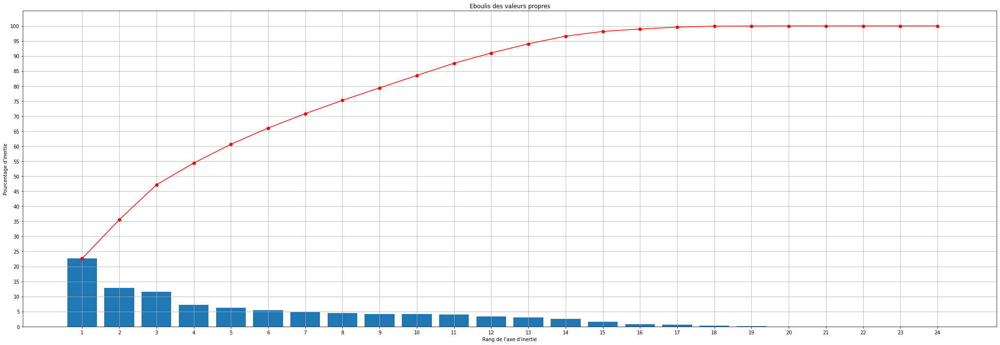

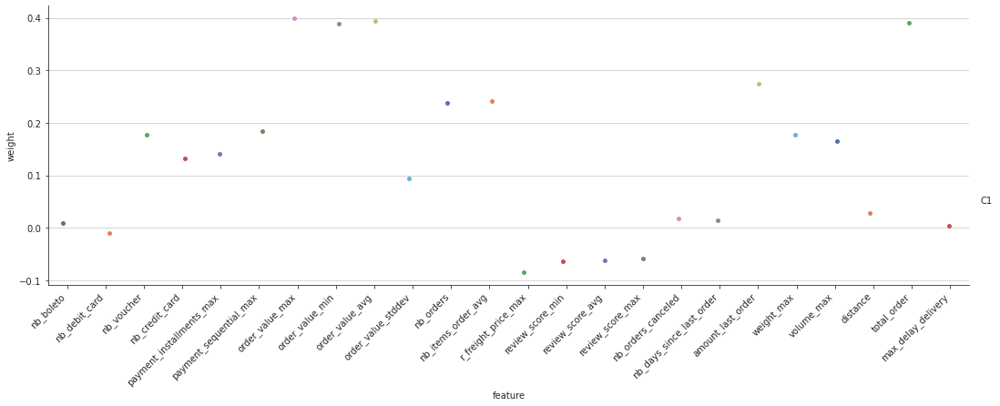

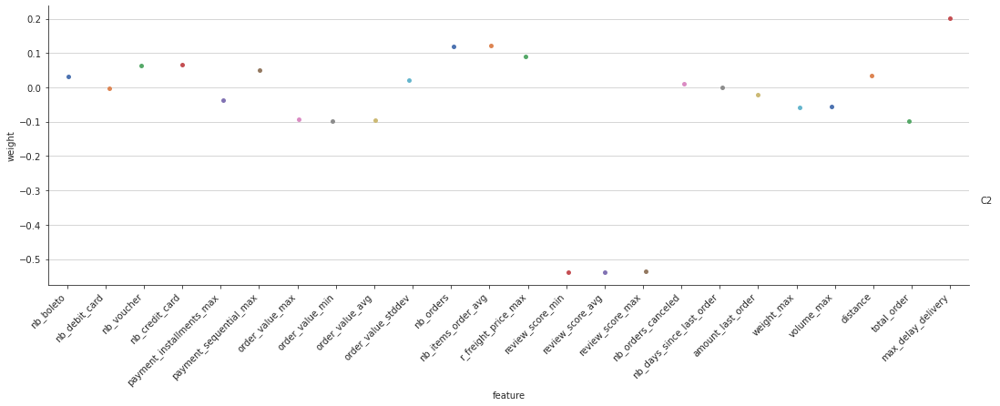

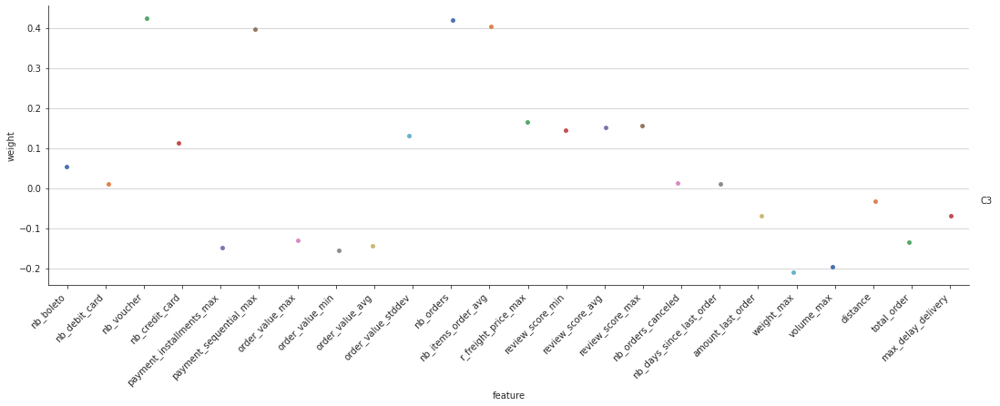

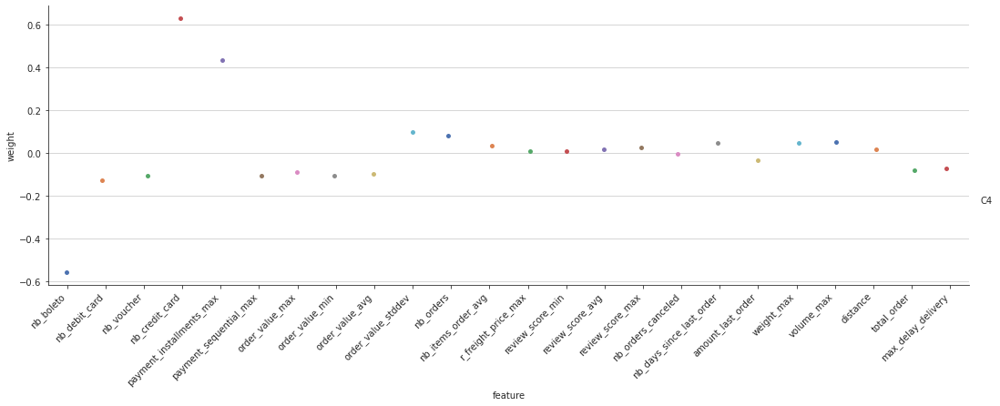

...

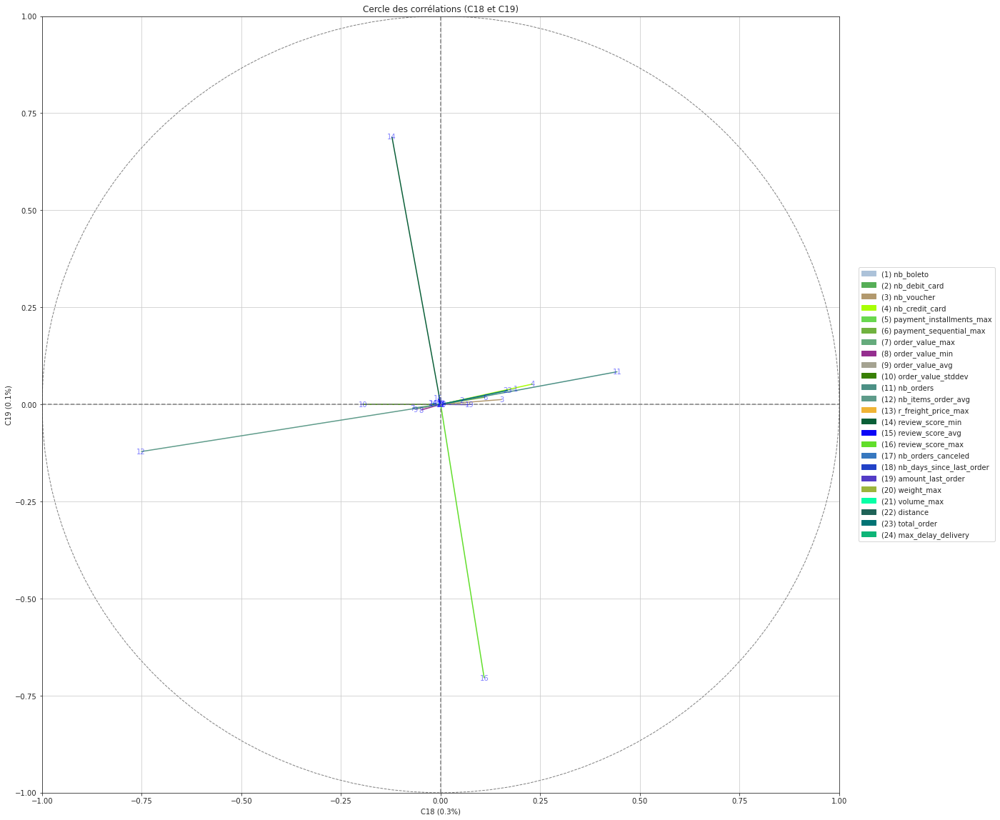

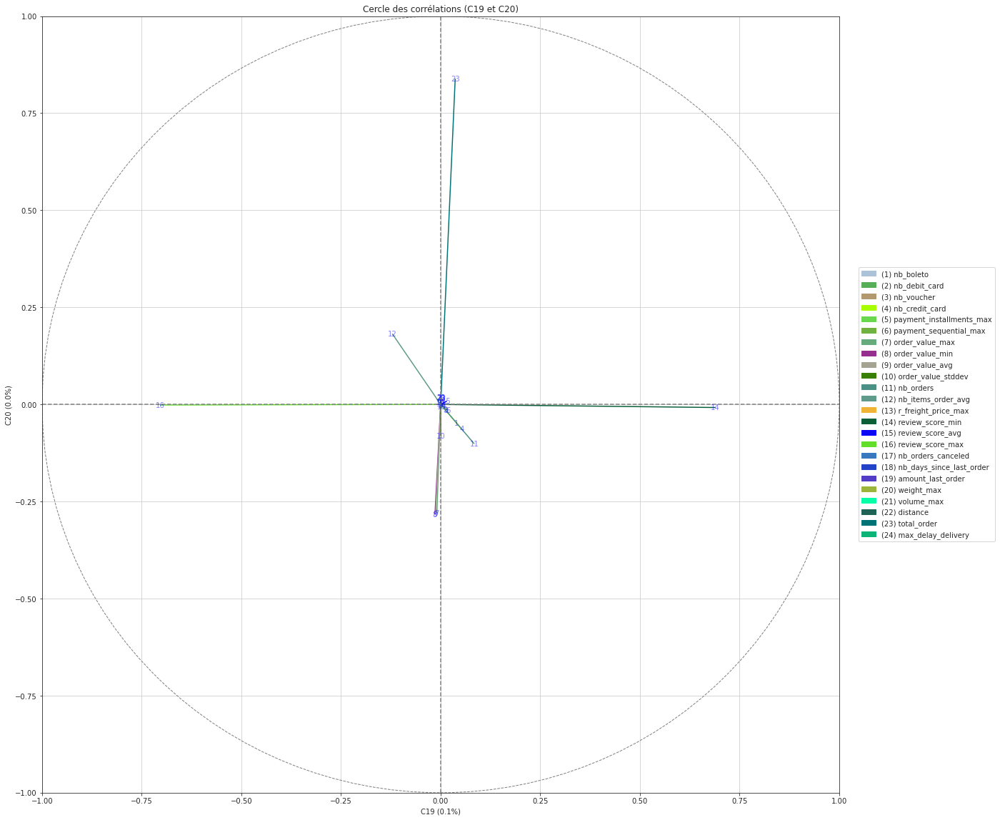

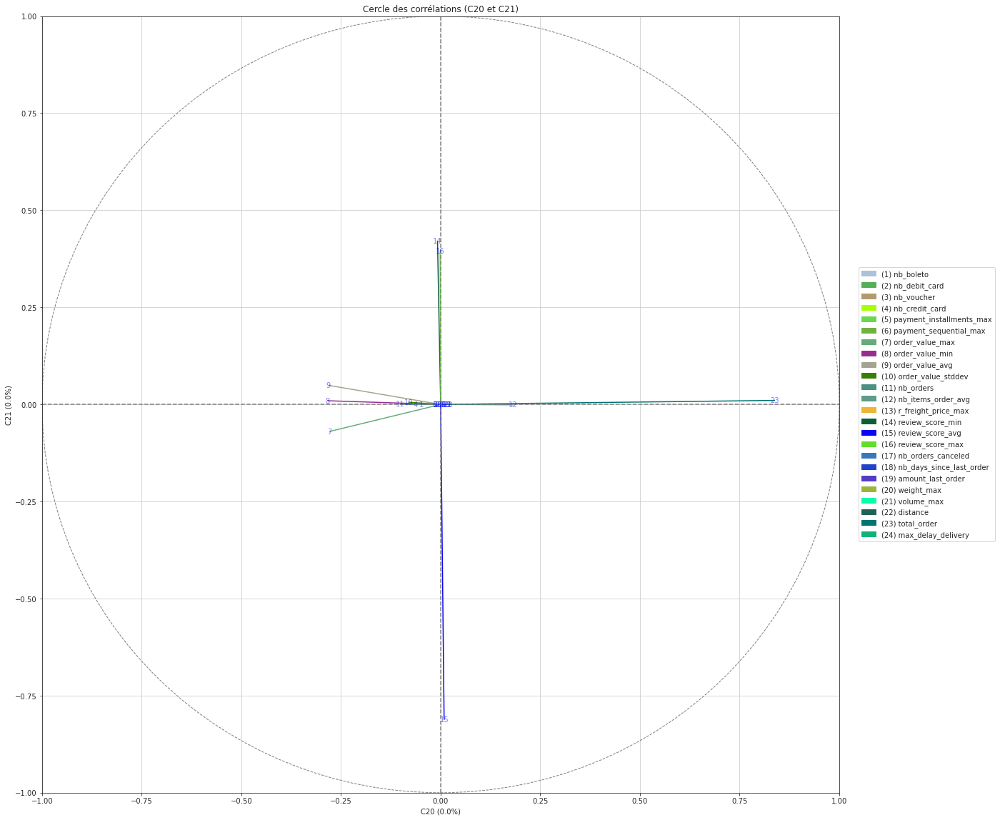

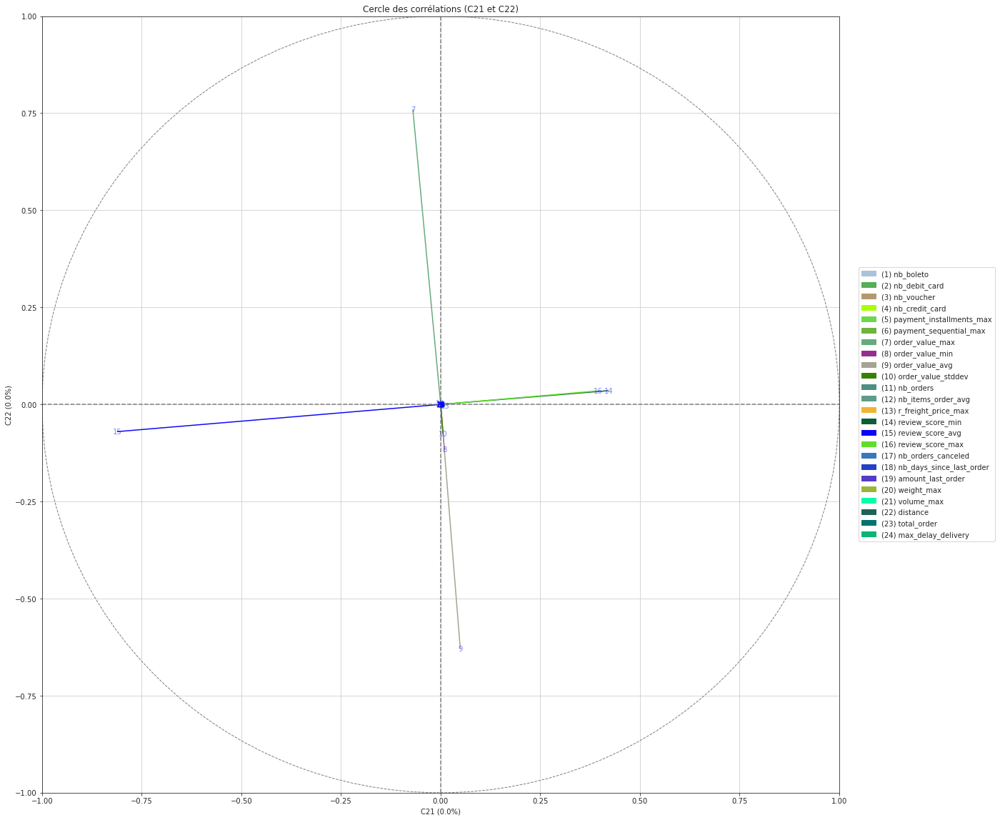

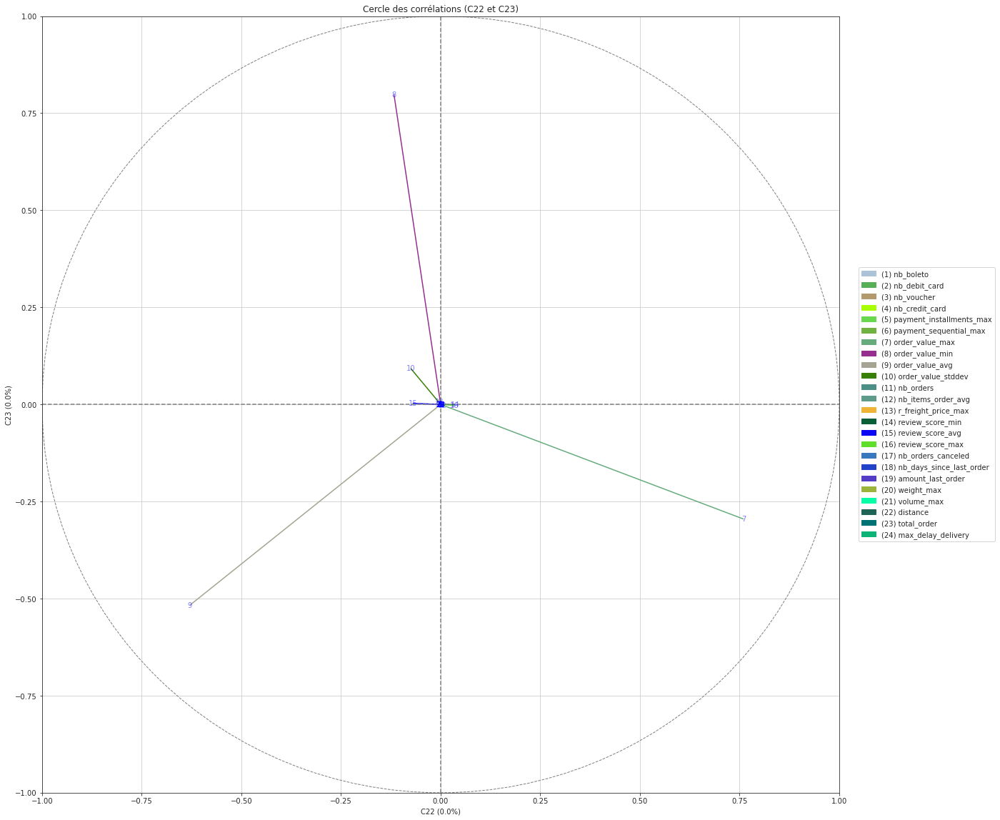

In [20]:
(pca,features) = do_pca(full_df)
display_scree_plot(pca)
display_components(pca,features)
display_circles(pca,features)

## Analyse des corrélations

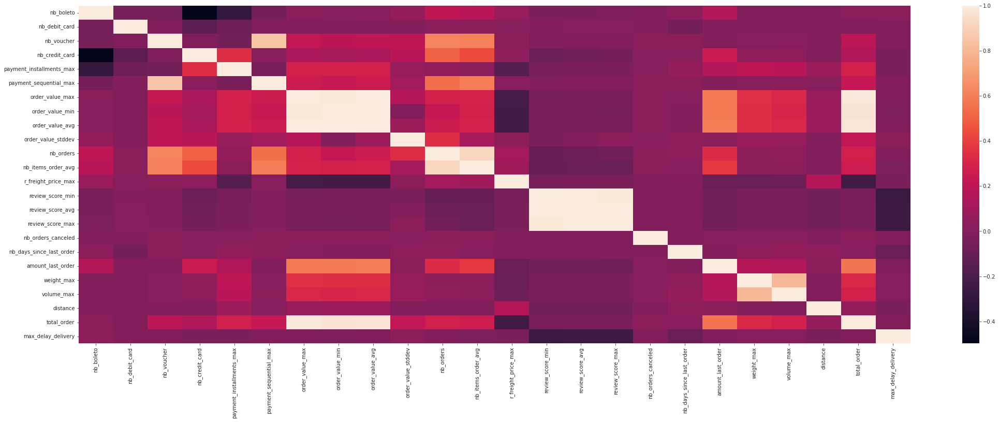

In [21]:
fig,ax = plt.subplots(figsize=(36,12))
_ = sns.heatmap(full_df.select_dtypes('number').corr(),ax=ax)

Filtrage des colonnes

In [36]:
#columns = full_df.select_dtypes('number').columns
#filtered_columns = list(filter(lambda x: x not in ['order_value_max','order_value_stddev','order_value_min','review_score_min','review_score_max'],columns))

In [37]:
#filters = [('nb_debit_card','3*IQR'),
#('payment_installments_max','3*IQR'),
#('payment_sequential_max',None),
#('order_value_max',None),
#('order_value_min',None),
#('order_value_avg','5*IQR'),
#('order_value_stddev',None),
#('nb_orders',lambda x : x > 10),
#('nb_items_order_avg',lambda x : x > 5),
#('r_freight_price_max','5*IQR'),
#('review_score_min',None),
#('review_score_avg',None),
#('review_score_max',None),
#('nb_orders_canceled',None),
#('nb_days_since_last_order',None),
#('amount_last_order','5*IQR'),
#('weight_max',lambda x : x == x.max()),
#('volume_max',None)]
#
#def filter_df(df,filters):
#    for f in filters:
#        if f is None:
#            continue
#
#        if type(f[1]) is str:
#            c = univariate_num_partition_filter(df,f[0],f[1])
#            df.drop(index=df[df[c] == 1].index,inplace=True)
#            df.drop(columns=c,inplace=True)
#
#        if callable(f):
#             l = f[0]
#             col = f[1]
#             df.drop(index=df[l(df[col])].index,inplace=True)
#
#filter_df(full_df,filters)
#

Analyse en composantes principales (colonnes filtrées)

In [38]:
#(pca,features)  = do_pca(full_df.loc[:,filtered_columns])
#display_scree_plot(pca)
#display_components(pca,features)
#display_circles(pca,features)

In [40]:
#from sklearn.preprocessing import StandardScaler
#
#d = full_df.select_dtypes('number')
#ndf =  pd.DataFrame(StandardScaler().fit_transform(d),columns=d.columns,index=full_df.index)

In [41]:
#data = pd.read_csv('./data/dfs/nfull2.csv',index_col='c_customer_unique_id')

In [42]:
#fig,ax = plt.subplots(figsize=(36,12))
#_ = sns.heatmap(abs(data.select_dtypes('number').corr()),ax=ax)

In [43]:
#ndf.to_csv(f'./data/dfs/nfull2.csv')

In [44]:
#for col in ndf.columns:
#    univariate_num(ndf[col])
#    plt.show()